# jeremydmoore_jp2_research

In [1]:
%matplotlib inline
# imports

# standard library
from pathlib import Path
 
# 3rd-party python libraries
import cv2
# import glymur not installed
import numpy as np
from matplotlib import pyplot as plt
from PIL import Image

# parameters for matplotlib to increase our figure size -- NOTE: figure sizes are in INCHES
plt.rcParams["figure.figsize"] = (16,16)
# on a high-dpi monitor this will increase the quality of plots on-screen
%config InlineBackend.figure_format = 'retina'

In [2]:
Path.cwd()

PosixPath('/Users/dlisla/Documents/GitHub/utk_jpeg2000_testing')

In [5]:
def get_file_path_list(directory):
    directory_path = Path(directory)
    directory_file_path_list = [x for x in directory_path.iterdir() if x.is_file()]
    directory_file_path_list = [directory_file_path for directory_file_path in directory_file_path_list if not directory_file_path.name.startswith('.')]
    return directory_file_path_list

In [8]:
test_directory = Path('/Users/dlisla/Pictures/utk_UTRecord/ut-record_v08-n01_1905-00/out')
test_file_path_list = sorted(get_file_path_list(test_directory))
len(test_file_path_list)

46

In [11]:
img1_path = test_file_path_list[0]
img1_path

PosixPath('/Users/dlisla/Pictures/utk_UTRecord/ut-record_v08-n01_1905-00/out/ut-record_1905_v08n01_001.tif')

In [12]:
test_image = cv2.imread(str(img1_path), cv2.IMREAD_UNCHANGED)

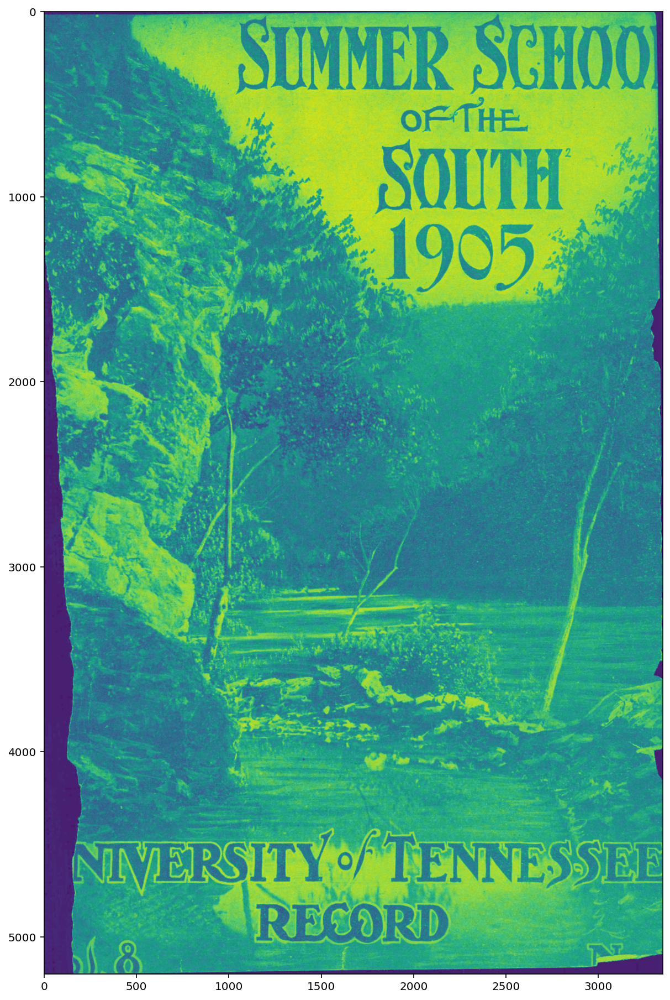

In [13]:
plt.imshow(test_image)

In [15]:
!magick identify -verbose "{img1_path}"

Image: /Users/dlisla/Pictures/utk_UTRecord/ut-record_v08-n01_1905-00/out/ut-record_1905_v08n01_001.tif
  Format: TIFF (Tagged Image File Format)
  Mime type: image/tiff
  Class: DirectClass
  Geometry: 3348x5201+0+0
  Resolution: 600x600
  Print size: 5.58x8.66833
  Units: PixelsPerInch
  Colorspace: Gray
  Type: Grayscale
  Endianess: LSB
  Depth: 8-bit
  Channel depth:
    Gray: 8-bit
  Channel statistics:
    Pixels: 17412948
    Gray:
      min: 0  (0)
      max: 227 (0.890196)
      mean: 129.586 (0.508182)
      standard deviation: 43.3185 (0.169877)
      kurtosis: -0.251207
      skewness: -0.166546
      entropy: 0.92594
  Colors: 228
  Histogram:
       153: (0,0,0) #000000 gray(0)
       434: (1,1,1) #010101 gray(1)
       679: (2,2,2) #020202 gray(2)
       775: (3,3,3) #030303 gray(3)
       946: (4,4,4) #040404 gray(4)
      1017: (5,5,5) #050505 gray(5)
      1067: (6,6,6) #060606 gray(6)
      1142: (7,7,7) #070707 gray(7)
      1218: (8,8,8) #080808 gray(8)
      1289:

  Convex hull: 0,0 3347,0 3347,5199 3339,5200 0,5200 0,0 
  Minimum bounding box: 3347,0 3347,5200 4.54747e-13,5200 1.36339e-13,0 
  Profiles:
    Profile-8bim: 8160 bytes
    Profile-icc: 408 bytes
    Profile-xmp: 14359 bytes
  Properties:
    date:create: 2020-04-07T12:21:17+00:00
    date:modify: 2020-03-23T20:36:54+00:00
    dc:format: image/tiff
    exif:PixelXDimension: 3348
    exif:PixelYDimension: 5201
    icc:copyright: Copyright 1999 Adobe Systems Incorporated
    icc:description: Gray Gamma 2.2
    minimum-bounding-box:angle: 0
    minimum-bounding-box:area: 1.74044e+07
    minimum-bounding-box:height: 3347
    minimum-bounding-box:unrotate: 0
    minimum-bounding-box:width: 5200
    photoshop:ColorMode: 1
    photoshop:ICCProfile: Gray Gamma 2.2
    signature: e09e146c6a9ad98b55698c347d45dbf93f7e79a8ffe8ea60c12dae2722659348
    tiff:alpha: unspecified
    tiff:endian: lsb
    tiff:photometric: min-is-black
    tiff:rows-per-strip: 2
    tiff:software: Adobe Photoshop 21.1

In [67]:
# navigate to the image
test_image_16bit_path = Path('/Users/dlisla/Pictures/athletics-programs/Output/vols-basketball_1969_001.tif')

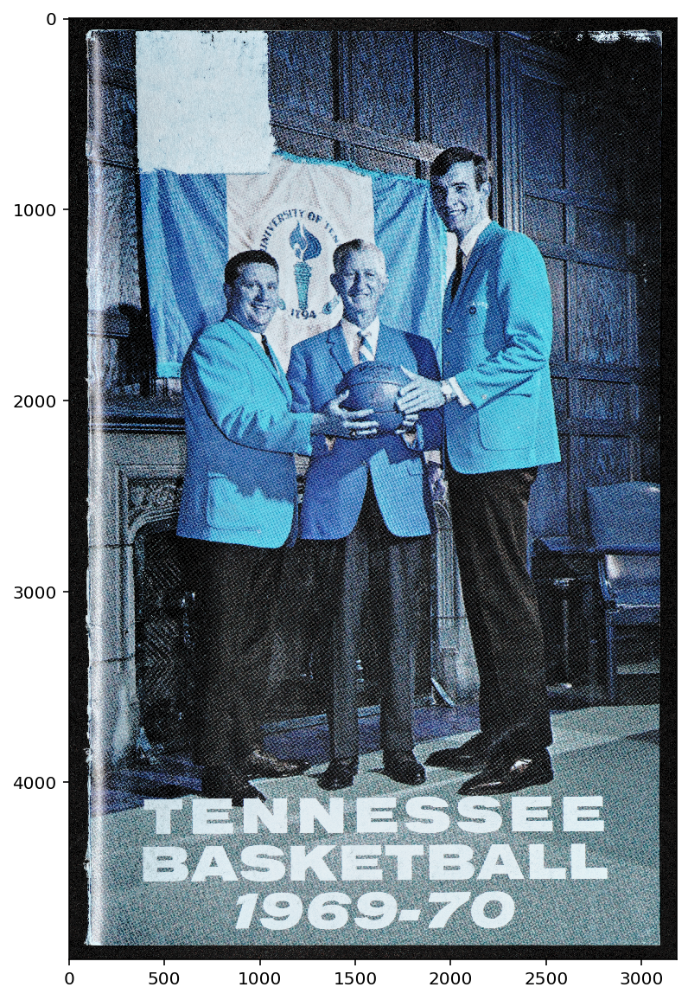

In [69]:
# opens or loads the image file
test_image_16bit = cv2.imread(str(test_image_16bit_path))
plt.imshow(test_image_16bit)

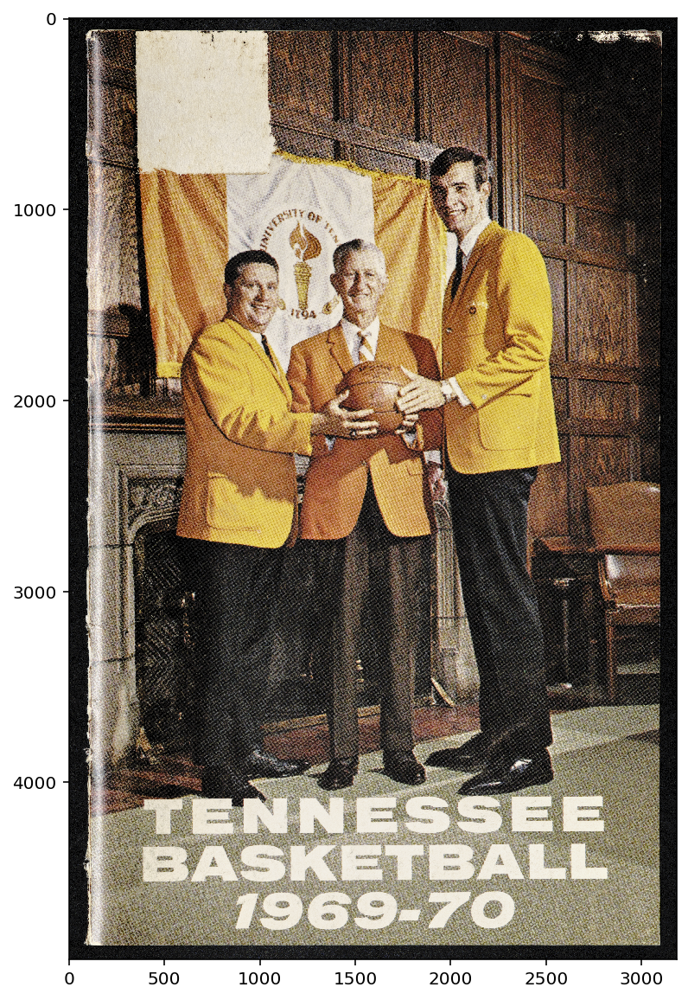

In [70]:
test_image_16bit = cv2.cvtColor(test_image_16bit, cv2.COLOR_BGR2RGB)
plt.imshow(test_image_16bit)

In [71]:
# getting the parts of the filename for automated saving to same location}
print(f'name: {test_image_16bit_path.name}')
print(f'stem: {test_image_16bit_path.stem}')
print(f'suffix: {test_image_16bit_path.suffix}')

name: vols-basketball_1969_001.tif
stem: vols-basketball_1969_001
suffix: .tif


In [76]:
# parent directory path for current path
test_image_16bit_path.parent

PosixPath('/Users/dlisla/Pictures/athletics-programs/Output')

In [79]:
# the dir() function is like opening a directory to see what's inside, but instead of directories
# you're access anything object in Python

# what can we can call by accessing glymur.<method>
dir(glymur)

['Jp2k',
 '__all__',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '__version__',
 '_iccprofile',
 '_tiff',
 'codestream',
 'config',
 'core',
 'data',
 'get_option',
 'get_parseoptions',
 'get_printoptions',
 'jp2box',
 'jp2k',
 'lib',
 'options',
 'reset_option',
 'set_option',
 'set_parseoptions',
 'set_printoptions',
 'version']

In [81]:
# convert to JPEG2000

# set our jp2 output name as same as TIFF input
jp2_test_image_16bit_name = f'{test_image_16bit_path.stem}.jp2'

# set output path to the same location
jp2_path = test_image_16bit_path.parent.joinpath(jp2_test_image_16bit_name)

# convert to jp2!
# this action encodes the image data into a file at the {jp2_path}
# NOTE: glymur can only write JPEG2000s that fit into memory
jp2_test_image_16bit = glymur.Jp2k(jp2_path, data=test_image_16bit)

In [88]:
jp2_path.suffix

'.jp2'

In [91]:
# now let's investigate the jp2 with JHOVE
def jhove(image_path):
    image_path = Path(image_path)
    acceptable_extension_list = ['.jp2']
    if image_path.suffix not in acceptable_extension_list:
        print(f'{image_path.name} has extension {image_path}')
        print(f'This function only works on images with extensions: {acceptable_extension_list}')
    else:
        if image_path.suffix == '.jp2':
            module = 'JPEG2000-hul'
        !~/jhove/jhove -m {module} {image_path}
    return

In [92]:
jhove(jp2_path)

Jhove (Rel. 1.24.1, 2020-03-16)
 Date: 2020-03-27 12:49:45 EDT
 RepresentationInformation: /Users/dlisla/Pictures/athletics-programs/Output/vols-basketball_1969_001.jp2
  ReportingModule: JPEG2000-hul, Rel. 1.4.2 (2019-10-18)
  LastModified: 2020-03-27 12:38:17 EDT
  Size: 27010760
  Format: JPEG 2000
  Status: Well-Formed and valid
  SignatureMatches:
   JPEG2000-hul
  MIMEtype: image/jp2
  Profile: JP2
  JPEG2000Metadata: 
   Brand: jp2 
   MinorVersion: 0
   Compatibility: jp2 
   ColorspaceUnknown: false
   ColorSpecs: 
    ColorSpec: 
     Method: Enumerated Colorspace
     Precedence: 0
     Approx: 0
     EnumCS: sRGB
   Codestreams: 
    Codestream: 
     ImageAndTileSize: 
      Capabilities: 0
      XSize: 3184
      YSize: 4926
      XOSize: 0
      YOSize: 0
      XTSize: 3184
      YTSize: 4926
      XTOSize: 0
      YTOSize: 0
      CSize: 3
      SSize: 7, 1, 1
      XRSize: 7, 1, 1
      YRSize: 7, 1, 1
     CodingStyleDefault: 
      CodingStyle: 0
      ProgressionOrd

In [93]:
# it created an 8-bit file in sRGB, so those options need to be changed!